In [37]:
# import library
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn2_circles
import seaborn as sns
from tqdm.notebook import tqdm
import pathlib
import plotly
import plotly.express as px

In [38]:
def calc_haversine(lat1, lon1, lat2, lon2):
    """Calculates the great circle distance between two points
    on the earth. Inputs are array-like and specified in decimal degrees.
    """
    RADIUS = 6_367_000
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    dist = 2 * RADIUS * np.arcsin(a**0.5)
    return dist

In [39]:
def visualize_trafic(df, center, zoom=9):
    fig = px.scatter_mapbox(df,
                            # Here, plotly gets, (x,y) coordinates
                            lat="latDeg",
                            lon="lngDeg",
                            
                            #Here, plotly detects color of series
                            color="phoneName",
                            labels="phoneName",
                            
                            zoom=zoom,
                            center=center,
                            height=600,
                            width=800)
    fig.update_layout(mapbox_style='stamen-terrain')
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.update_layout(title_text="GPS trafic")
    fig.show()
    
def visualize_collection(df, collection):
    target_df = df[df['collectionName']==collection].copy()
    lat_center = target_df['latDeg'].mean()
    lng_center = target_df['lngDeg'].mean()
    center = {"lat":lat_center, "lon":lng_center}
    
    visualize_trafic(target_df, center)

In [40]:
def add_distance_diff(df):
    # shift(1): 上のやつが1個下に下がる → 前のデータ
    # shift(-1): 下のやつが1個上に上がる → 次のデータ
    df['latDeg_prev'] = df['latDeg'].shift(1)
    df['latDeg_next'] = df['latDeg'].shift(-1)
    df['lngDeg_prev'] = df['lngDeg'].shift(1)
    df['lngDeg_next'] = df['lngDeg'].shift(-1)
    df['phone_prev'] = df['phone'].shift(1)
    df['phone_next'] = df['phone'].shift(-1)
    
    df['latDeg_gt_prev'] = df['latDeg_gt'].shift(1)
    df['latDeg_gt_next'] = df['latDeg_gt'].shift(-1)
    df['lngDeg_gt_prev'] = df['lngDeg_gt'].shift(1)
    df['lngDeg_gt_next'] = df['lngDeg_gt'].shift(-1)
    
    df['latDeg_prev_diff'] = df['latDeg'] - df['latDeg_prev']
    df['latDeg_next_diff'] = df['latDeg_next'] - df['latDeg']
    df['latDeg_gt_prev_diff'] = df['latDeg_gt'] - df['latDeg_gt_prev']
    df['latDeg_gt_next_diff'] = df['latDeg_gt_next'] - df['latDeg_gt']
    
    df['lngDeg_prev_diff'] = df['lngDeg'] - df['lngDeg_prev']
    df['lngDeg_next_diff'] = df['lngDeg_next'] - df['lngDeg']
    df['lngDeg_gt_prev_diff'] = df['lngDeg_gt'] - df['lngDeg_gt_prev']
    df['lngDeg_gt_next_diff'] = df['lngDeg_gt_next'] - df['lngDeg_gt']
    
    df['dist_prev'] = calc_haversine(df['latDeg'], df['lngDeg'], df['latDeg_prev'], df['lngDeg_prev'])
    df['dist_next'] = calc_haversine(df['latDeg'], df['lngDeg'], df['latDeg_next'], df['lngDeg_next'])
    
    df['dist_gt_prev'] = calc_haversine(df['latDeg_gt'], df['lngDeg_gt'], df['latDeg_gt_prev'], df['lngDeg_gt_prev'])
    df['dist_gt_next'] = calc_haversine(df['latDeg_gt'], df['lngDeg_gt'], df['latDeg_gt_next'], df['lngDeg_gt_next'])
    
    df.loc[df['phone']!=df['phone_prev'], ['latDeg_prev', 'lngDeg_prev', 'dist_prev', 
                                           'latDeg_gt_prev', 'lngDeg_gt_prev', 'dist_gt_prev',
                                          'latDeg_prev_diff', 'latDeg_gt_prev_diff',
                                          'lngDeg_prev_diff', 'lngDeg_gt_prev_diff']] = np.nan
    
    df.loc[df['phone']!=df['phone_next'], ['latDeg_next', 'lngDeg_next', 'dist_next', 
                                           'latDeg_gt_next', 'lngDeg_gt_next', 'dist_gt_next',
                                          'latDeg_next_diff', 'latDeg_gt_next_diff',
                                          'lngDeg_next_diff', 'lngDeg_gt_next_diff']] = np.nan
    
    return df

In [41]:
INPUT = '../input/google-smartphone-decimeter-challenge'

# train = pd.read_csv(INPUT + '/' + 'baseline_locations_train.csv')
train = pd.read_csv('../output/filtered_nb017.csv')
test = pd.read_csv(INPUT + '/' + 'baseline_locations_test.csv')
sample_sub = pd.read_csv(INPUT + '/' + 'sample_submission.csv')

# ground truth
p = pathlib.Path(INPUT)
gt_files = list(p.glob('train/*/*/ground_truth.csv'))

gts = []
for gt_file in gt_files:
    gts.append(pd.read_csv(gt_file))
ground_truth = pd.concat(gts)

## EDA

In [42]:
tmp1 = ground_truth.copy()
tmp1['phone'] = tmp1['collectionName'] + '_' + tmp1['phoneName']
tmp1['phoneName'] = tmp1['phoneName'] + '_GT'
tmp = train.append(tmp1)

In [43]:
# sub形式にしたtrain済みbaselineを、gtとmergeできる形にする
train['collectionName'] = train['phone'].apply(lambda x: x.split('_')[0])
train['phoneName'] = train['phone'].apply(lambda x: x.split('_')[1])
train.head()

,phone,millisSinceGpsEpoch,latDeg,lngDeg,collectionName,phoneName
0,2020-05-14-US-MTV-1_Pixel4,1273529463442,37.423549,-122.094006,2020-05-14-US-MTV-1,Pixel4
1,2020-05-14-US-MTV-1_Pixel4,1273529464442,37.423563,-122.094056,2020-05-14-US-MTV-1,Pixel4
2,2020-05-14-US-MTV-1_Pixel4,1273529465442,37.423571,-122.094090,2020-05-14-US-MTV-1,Pixel4
3,2020-05-14-US-MTV-1_Pixel4,1273529466442,37.423576,-122.094109,2020-05-14-US-MTV-1,Pixel4
4,2020-05-14-US-MTV-1_Pixel4,1273529467442,37.423577,-122.094116,2020-05-14-US-MTV-1,Pixel4


In [44]:
ground_truth = ground_truth.rename(columns={'latDeg':'latDeg_gt', 'lngDeg':'lngDeg_gt',
                                           'heightAboveWgs84EllipsoidM':'heightAboveWgs84EllipsoidM_gt'})
train = train.merge(ground_truth, on=['collectionName', 'phoneName', 'millisSinceGpsEpoch'], how='inner')
train['dist_err'] = calc_haversine(train['latDeg_gt'], train['lngDeg_gt'], train['latDeg'], train['lngDeg'])
train = add_distance_diff(train)
train.head()

,phone,millisSinceGpsEpoch,latDeg,lngDeg,collectionName,phoneName,latDeg_gt,lngDeg_gt,heightAboveWgs84EllipsoidM_gt,timeSinceFirstFixSeconds,...,latDeg_gt_prev_diff,latDeg_gt_next_diff,lngDeg_prev_diff,lngDeg_next_diff,lngDeg_gt_prev_diff,lngDeg_gt_next_diff,dist_prev,dist_next,dist_gt_prev,dist_gt_next
0,2020-05-14-US-MTV-1_Pixel4,1273529463442,37.423549,-122.094006,2020-05-14-US-MTV-1,Pixel4,37.423576,-122.094132,33.21,551.44,...,NaN,2.999982e-10,NaN,-0.000049,NaN,-1.700002e-09,NaN,4.603970,NaN,0.000154
1,2020-05-14-US-MTV-1_Pixel4,1273529464442,37.423563,-122.094056,2020-05-14-US-MTV-1,Pixel4,37.423576,-122.094132,33.21,552.44,...,2.999982e-10,1.040000e-08,-0.000049,-0.000035,-1.700002e-09,3.400004e-09,4.603970,3.198768,0.000154,0.001194
2,2020-05-14-US-MTV-1_Pixel4,1273529465442,37.423571,-122.094090,2020-05-14-US-MTV-1,Pixel4,37.423576,-122.094132,33.21,553.44,...,1.040000e-08,1.140000e-08,-0.000035,-0.000019,3.400004e-09,1.600000e-09,3.198768,1.722592,0.001194,0.001275
3,2020-05-14-US-MTV-1_Pixel4,1273529466442,37.423576,-122.094109,2020-05-14-US-MTV-1,Pixel4,37.423576,-122.094132,33.20,554.44,...,1.140000e-08,9.900006e-09,-0.000019,-0.000007,1.600000e-09,-1.600000e-09,1.722592,0.612324,0.001275,0.001109
4,2020-05-14-US-MTV-1_Pixel4,1273529467442,37.423577,-122.094116,2020-05-14-US-MTV-1,Pixel4,37.423576,-122.094132,33.20,555.44,...,9.900006e-09,1.350000e-08,-0.000007,-0.000008,-1.600000e-09,-3.400004e-09,0.612324,0.782343,0.001109,0.001530


In [45]:
train.describe()

,millisSinceGpsEpoch,latDeg,lngDeg,latDeg_gt,lngDeg_gt,heightAboveWgs84EllipsoidM_gt,timeSinceFirstFixSeconds,hDop,vDop,speedMps,...,latDeg_gt_prev_diff,latDeg_gt_next_diff,lngDeg_prev_diff,lngDeg_next_diff,lngDeg_gt_prev_diff,lngDeg_gt_next_diff,dist_prev,dist_next,dist_gt_prev,dist_gt_next
count,1.313420e+05,131342.000000,131342.000000,131342.000000,131342.000000,131342.000000,131342.000000,131342.000000,131342.0,131342.000000,...,131269.000000,131269.000000,131269.000000,131269.000000,131269.000000,131269.000000,131269.000000,131269.000000,131269.000000,131269.000000
mean,1.287913e+12,37.435205,-122.154923,37.435201,-122.154926,87.028847,1213.986316,10.146238,0.0,18.220691,...,0.000009,0.000009,-0.000020,-0.000020,-0.000020,-0.000020,18.403062,18.403062,18.232110,18.232110
std,1.162110e+10,0.082712,0.145972,0.082713,0.145972,56.999876,609.145524,56.707267,0.0,12.698756,...,0.000142,0.000142,0.000176,0.000176,0.000176,0.000176,12.496126,12.496126,12.767190,12.767190
min,1.273529e+12,37.322858,-122.428932,37.322839,-122.428838,31.160000,47.430000,0.000000,0.0,0.000000,...,-0.000584,-0.000584,-0.001641,-0.001641,-0.002470,-0.002470,0.000000,0.000000,0.000000,0.000000
25%,1.275424e+12,37.371572,-122.275109,37.371573,-122.275114,37.160000,718.430000,0.900000,0.0,5.260000,...,-0.000071,-0.000071,-0.000167,-0.000167,-0.000167,-0.000167,5.408860,5.408860,5.302538,5.302538
50%,1.283279e+12,37.424360,-122.118313,37.424355,-122.118312,63.520000,1174.430000,1.300000,0.0,22.020000,...,0.000000,0.000000,-0.000003,-0.000003,0.000000,0.000000,22.061153,22.061153,22.003659,22.003659
75%,1.302558e+12,37.469106,-122.069086,37.469097,-122.069092,122.330000,1659.440000,2.500000,0.0,29.310000,...,0.000117,0.000117,0.000075,0.000075,0.000075,0.000075,29.296311,29.296311,29.294606,29.294606
max,1.303771e+12,37.690801,-121.881879,37.690794,-121.881852,247.850000,3216.450000,655.300000,0.0,45.010000,...,0.002970,0.002970,0.000537,0.000537,0.000485,0.000485,222.799845,222.799845,330.472320,330.472320


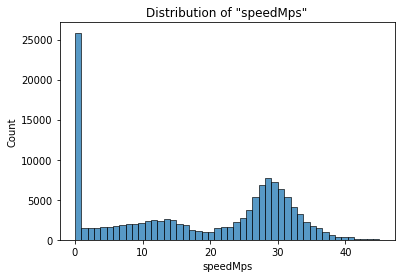

In [46]:
sns.histplot(train['speedMps'])
plt.title('Distribution of "speedMps"');

In [47]:
train.loc[train['speedMps']==0.0, 'speed0'] = 'speed = 0'
train.loc[train['speedMps']>0.0, 'speed0'] = 'speed > 0'

<AxesSubplot:xlabel='speed0', ylabel='dist_err'>

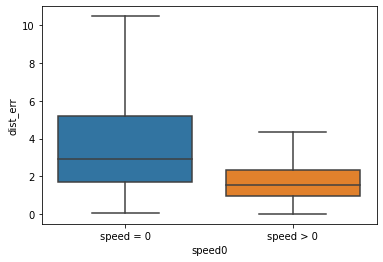

In [48]:
sns.boxplot(x='speed0', y='dist_err', data=train, showfliers=False)

### visualize_err_move_dist
- baselineとgtとの誤差
- baselineの移動距離、gtの移動距離とスピードのグラフ

In [49]:
def visualize_err_move_dist(df, phone, reject_outlier=True):
    fig, axes = plt.subplots(figsize=(20, 10), nrows=2, sharex=True)
    df = df[df['phone']==phone]
    if reject_outlier:
        th = (df['dist_err'].std()*3) + df['dist_err'].mean() # 99.7%信頼区間
        df = df[df['dist_err']<th]
        
    axes[0].plot(df['millisSinceGpsEpoch'], df['dist_err'], label='err(baseline)')
    axes[1].plot(df['millisSinceGpsEpoch'], df['speedMps'], label='speedMps')
    axes[1].plot(df['millisSinceGpsEpoch'], df['dist_prev'], label='move dist(baseline)')
    axes[1].plot(df['millisSinceGpsEpoch'], df['dist_gt_prev'], label='move dist(ground_truth)')
    axes[0].legend(loc='upper right')
    axes[1].legend(loc='upper right')
    axes[0].grid(color='g', linestyle=':', linewidth=0.3)
    axes[1].grid(color='g', linestyle=':', linewidth=0.3)
    fig.suptitle(phone, fontsize=16)

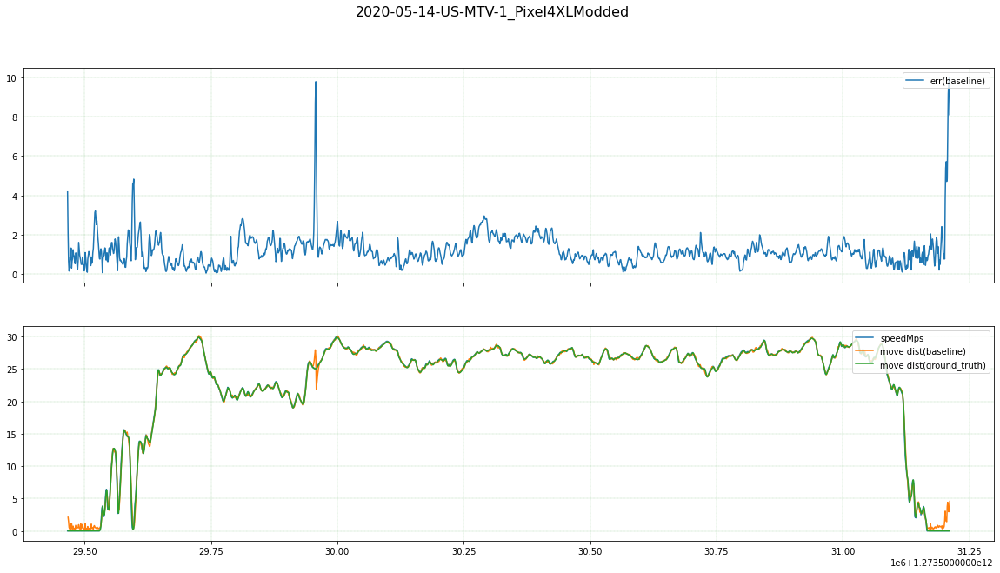

In [50]:
visualize_err_move_dist(train, '2020-05-14-US-MTV-1_Pixel4XLModded', reject_outlier=False)

/Users/shugo/Desktop/Competitions/kaggle/outdoor/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


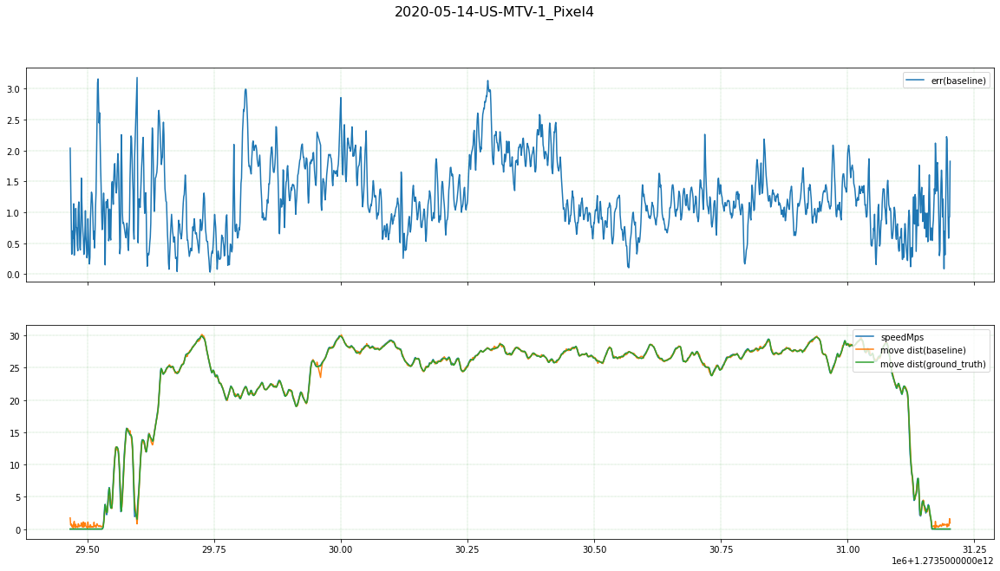

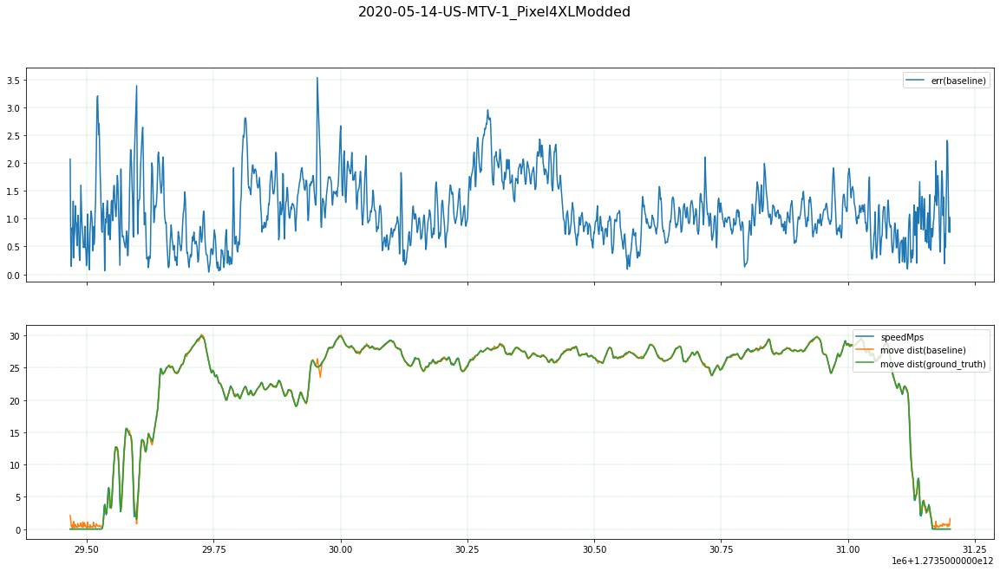

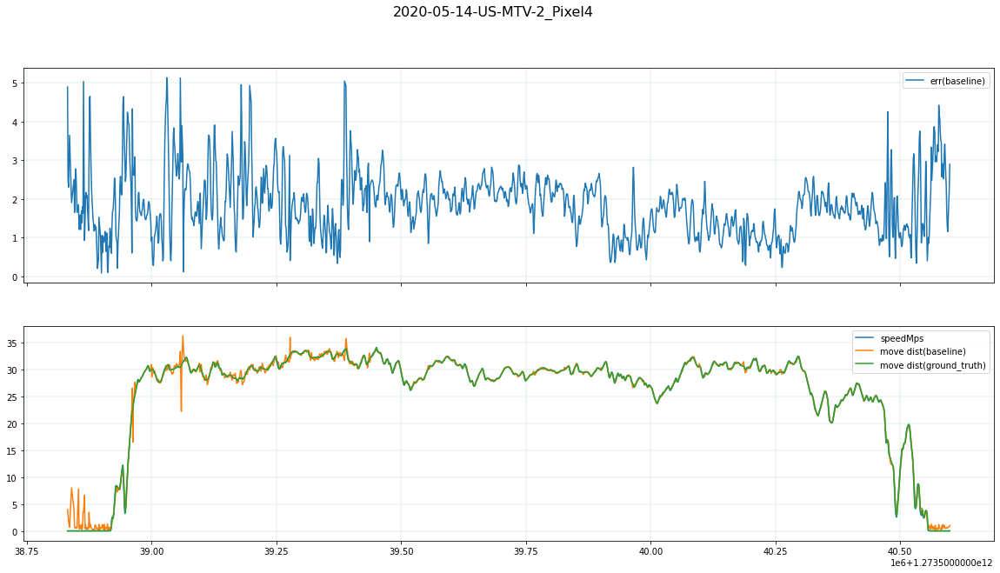

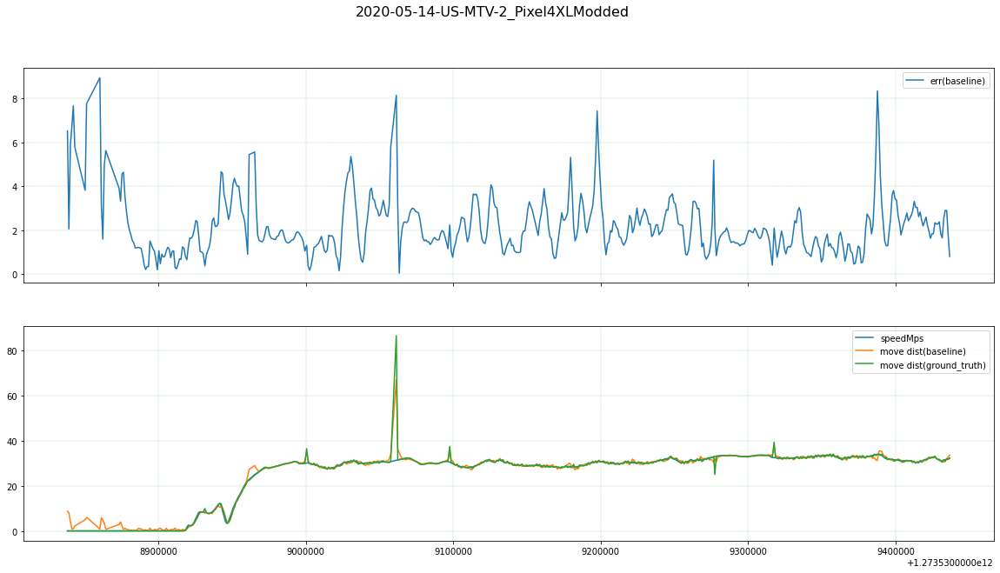

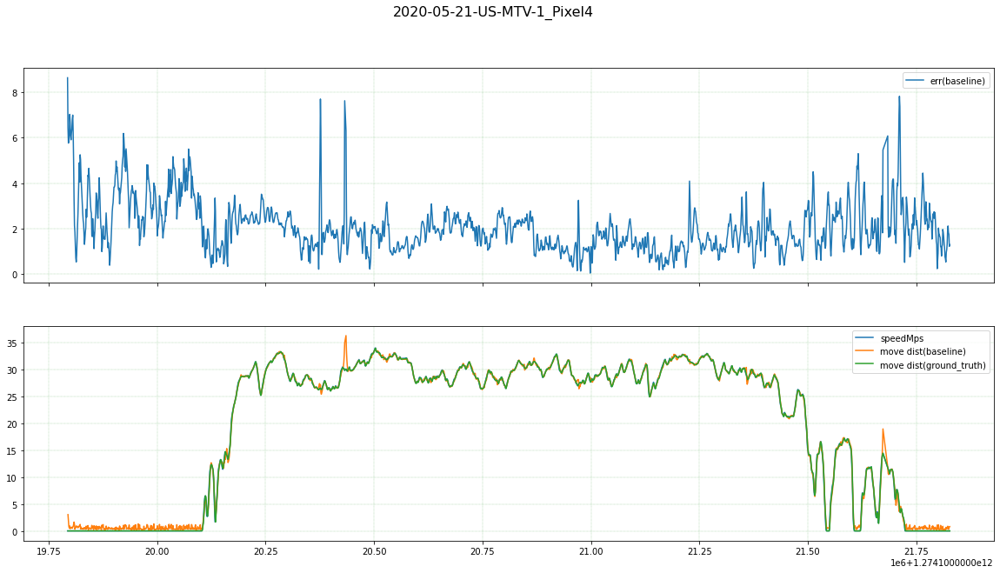

...

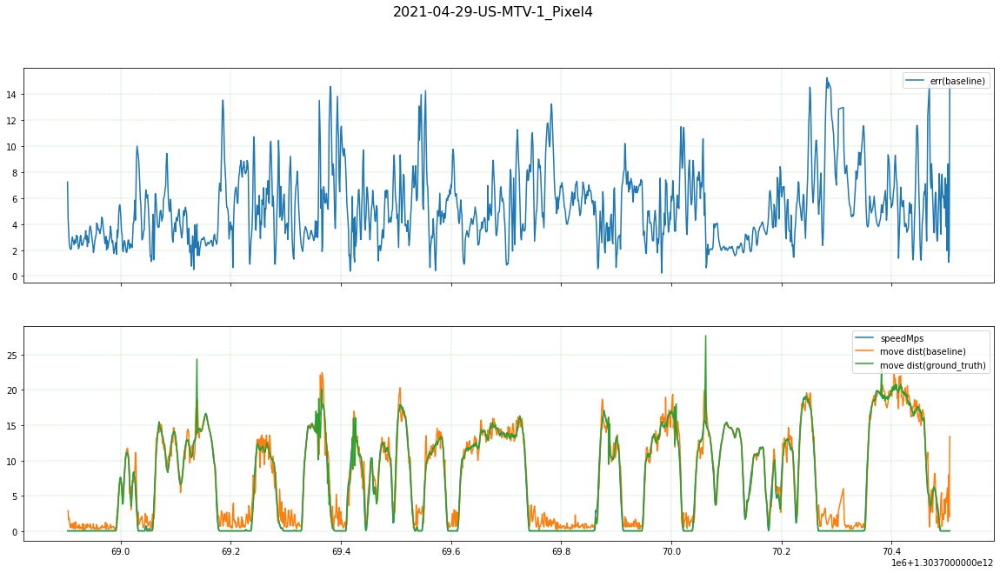

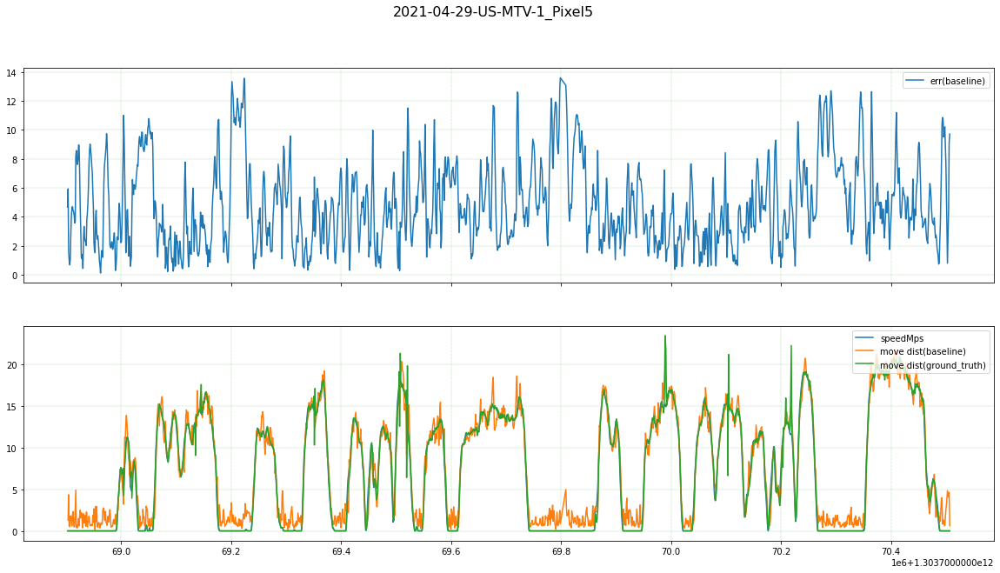

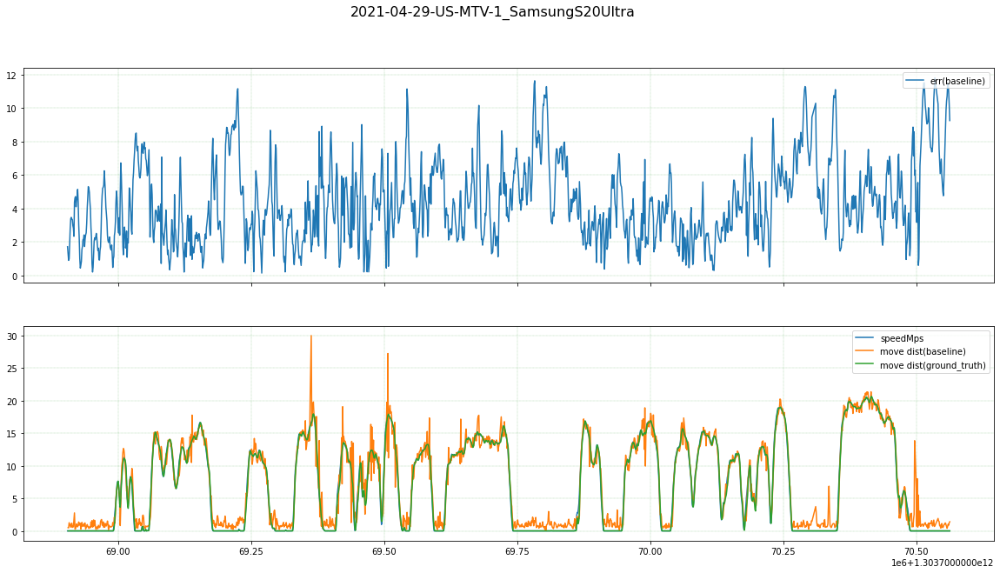

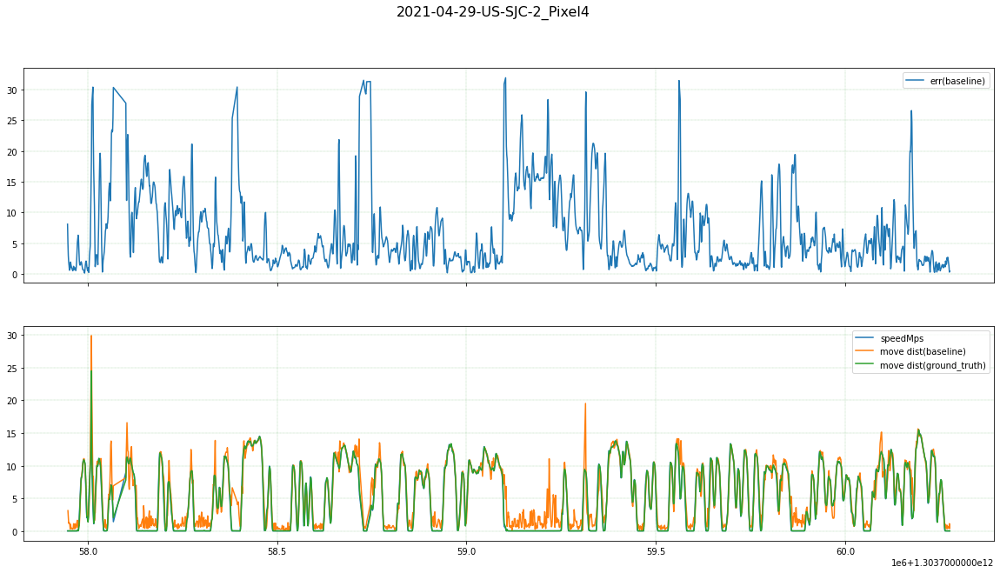

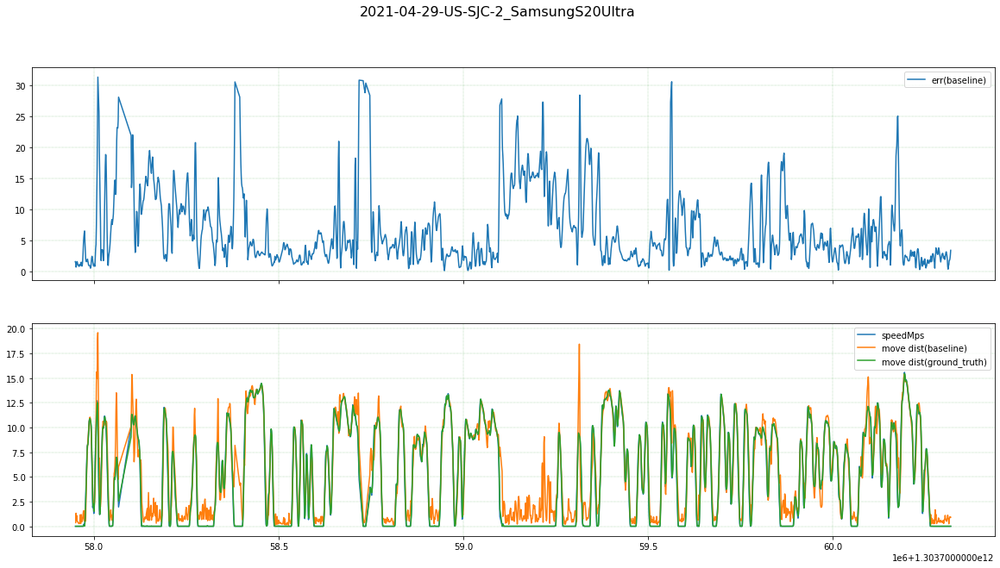

In [51]:
phones = train['phone'].unique()
for phone in phones:
    visualize_err_move_dist(train, phone)